discharge.linear.0_deg	 total_capacity: 185.48mAh 	 discharge_time: 85.82 minutes
discharge.linear.10_deg	 total_capacity: 273.04mAh 	 discharge_time: 128.81 minutes
discharge.linear.15_deg	 total_capacity: 315.58mAh 	 discharge_time: 150.71 minutes
discharge.linear.25_deg	 total_capacity: 343.47mAh 	 discharge_time: 164.62 minutes
discharge.linear.35_deg	 total_capacity: 355.54mAh 	 discharge_time: 170.53 minutes
discharge.linear.min_10_deg	 total_capacity: 95.17mAh 	 discharge_time: 43.13 minutes
discharge.linear.min_20_deg	 total_capacity: 36.74mAh 	 discharge_time: 16.28 minutes


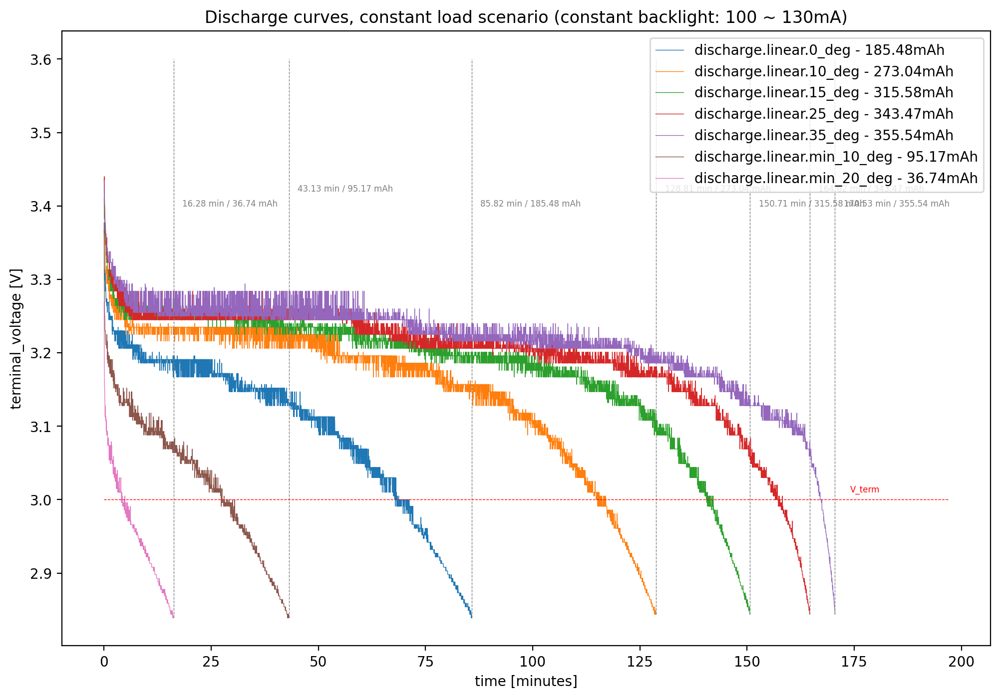

In [ ]:
import matplotlib.pyplot as plt
from fuel_gauge.profile_data_utils import *
from archive.battery_profiling import *
from matplotlib import style

# Load linear discharge profiles from dataset

dataset_path = Path("dataset/202502_phd/device_1/linear")
discharge_curves = dataset_path.rglob("discharge.linear.*.csv")

fig, ax = plt.subplots()
fig.set_size_inches(12,8)
fig.set_dpi(200)

for i, crv_path in enumerate(sorted(discharge_curves)):

    data = load_measured_data(crv_path)

    # Calcultate accumulated charge
    total_charge_mAh = coulomb_counter(data.time, data.ibat)

    time_min = time_to_minutes(data.time)
    ax.plot(time_min, data.vbat, label=f"{crv_path.stem} - {total_charge_mAh:.2f}mAh", linewidth=0.5)
    ax.vlines(x=time_min[-1], ymin=min(data.vbat), ymax=3.6, color='gray', linestyle='--', linewidth=0.5)
    ax.text(x=time_min[-1]+2, y=3.4+(0.02*(i%2)), s=f"{time_min[-1]:.2f} min / {total_charge_mAh:.2f} mAh", fontsize=6, color="gray")
    print(f"{crv_path.stem}\t total_capacity: {total_charge_mAh:.2f}mAh \t discharge_time: {time_min[-1]:.2f} minutes")

ax.set
left, right = ax.get_xlim()
ax.hlines(y=3.0, xmin=0, xmax=right*1.1, color='r', linestyle='--', linewidth=0.5)
ax.text(x=right-5, y=3.01, s=f"V_term", fontsize=6, color="red")
ax.set_xlabel("time [minutes]")
ax.set_ylabel("terminal_voltage [V]")
ax.set_title("Discharge curves, constant load scenario (constant backlight: 100 ~ 130mA)")
ax.legend()

plt.show()



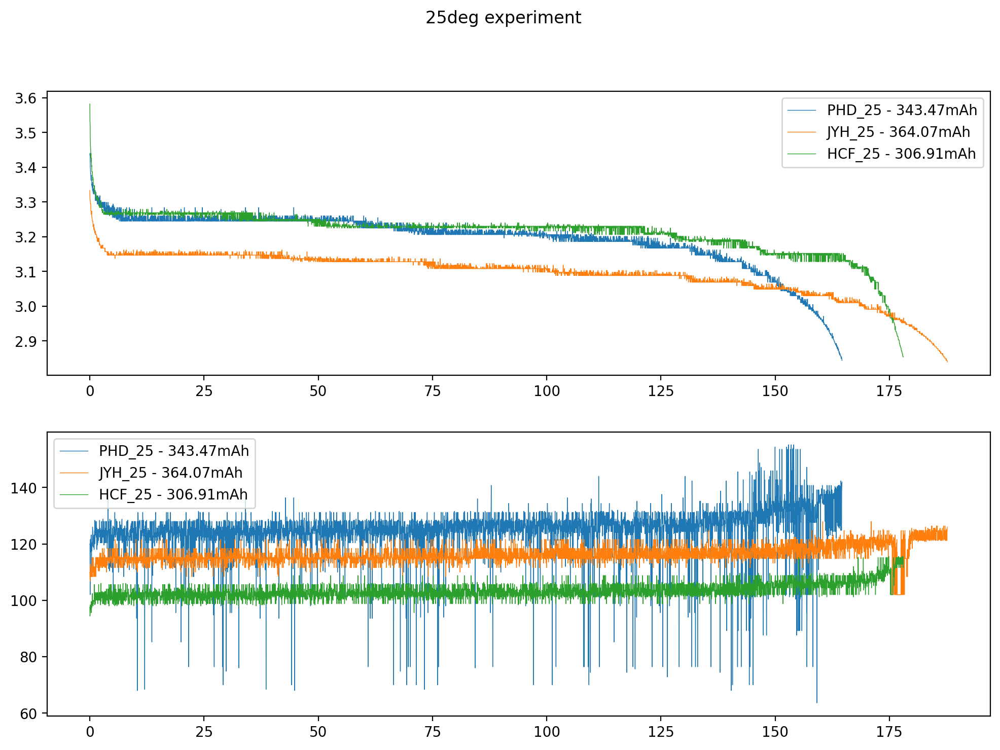

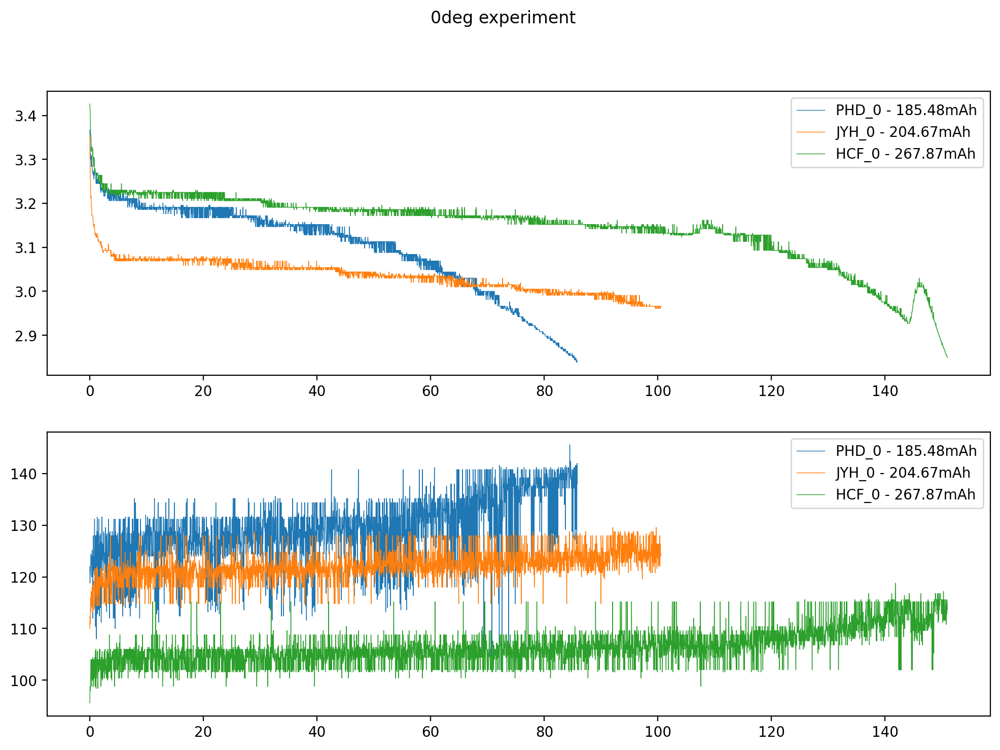

In [2]:



PHD_0  = load_measured_data("dataset/202502_phd/device_1/linear/discharge.linear.0_deg.csv")
PHD_25 = load_measured_data("dataset/202502_phd/device_1/linear/discharge.linear.25_deg.csv")

JYH_0  = load_measured_data("dataset/JYH_PFL333838/discharge.linear.0_deg.csv")
JYH_25 = load_measured_data("dataset/JYH_PFL333838/discharge.linear.25_deg.csv")

HCF_0  = load_measured_data("dataset/HCF_343837/discharge.linear.0_deg.csv")
HCF_25 = load_measured_data("dataset/HCF_343837/discharge.linear.25_deg.csv")


fig, ax = plt.subplots(2,1)
fig.set_size_inches(12,8)
fig.set_dpi(200)

fig.suptitle("25deg experiment")

time_min = time_to_minutes(PHD_25.time)
ax[0].plot(time_min, PHD_25.vbat, label=f"PHD_25 - {coulomb_counter(PHD_25.time, PHD_25.ibat):.2f}mAh", linewidth=0.5)
time_min_JYH = time_to_minutes(JYH_25.time)
ax[0].plot(time_min_JYH, JYH_25.vbat, label=f"JYH_25 - {coulomb_counter(JYH_25.time, JYH_25.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF = time_to_minutes(HCF_25.time)
ax[0].plot(time_min_HCF, HCF_25.vbat, label=f"HCF_25 - {coulomb_counter(HCF_25.time, HCF_25.ibat):.2f}mAh", linewidth=0.5)

ax[0].legend()

time_min = time_to_minutes(PHD_25.time)
ax[1].plot(time_min, PHD_25.ibat, label=f"PHD_25 - {coulomb_counter(PHD_25.time, PHD_25.ibat):.2f}mAh", linewidth=0.5)
time_min_JYH = time_to_minutes(JYH_25.time)
ax[1].plot(time_min_JYH, JYH_25.ibat, label=f"JYH_25 - {coulomb_counter(JYH_25.time, JYH_25.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF = time_to_minutes(HCF_25.time)
ax[1].plot(time_min_HCF, HCF_25.ibat, label=f"HCF_25 - {coulomb_counter(HCF_25.time, HCF_25.ibat):.2f}mAh", linewidth=0.5)

ax[1].legend()

fig, ax = plt.subplots(2,1)
fig.set_size_inches(12,8)
fig.set_dpi(200)

fig.suptitle("0deg experiment")

time_min = time_to_minutes(PHD_0.time)
ax[0].plot(time_min, PHD_0.vbat, label=f"PHD_0 - {coulomb_counter(PHD_0.time, PHD_0.ibat):.2f}mAh", linewidth=0.5)
time_min_JYH = time_to_minutes(JYH_0.time)
ax[0].plot(time_min_JYH, JYH_0.vbat, label=f"JYH_0 - {coulomb_counter(JYH_0.time, JYH_0.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF = time_to_minutes(HCF_0.time)
ax[0].plot(time_min_HCF, HCF_0.vbat, label=f"HCF_0 - {coulomb_counter(HCF_0.time, HCF_0.ibat):.2f}mAh", linewidth=0.5)

ax[0].legend()

time_min = time_to_minutes(PHD_0.time)
ax[1].plot(time_min, PHD_0.ibat, label=f"PHD_0 - {coulomb_counter(PHD_0.time, PHD_0.ibat):.2f}mAh", linewidth=0.5)
time_min_JYH = time_to_minutes(JYH_0.time)
ax[1].plot(time_min_JYH, JYH_0.ibat, label=f"JYH_0 - {coulomb_counter(JYH_0.time, JYH_0.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF = time_to_minutes(HCF_0.time)
ax[1].plot(time_min_HCF, HCF_0.ibat, label=f"HCF_0 - {coulomb_counter(HCF_0.time, HCF_0.ibat):.2f}mAh", linewidth=0.5)

ax[1].legend()


plt.show()


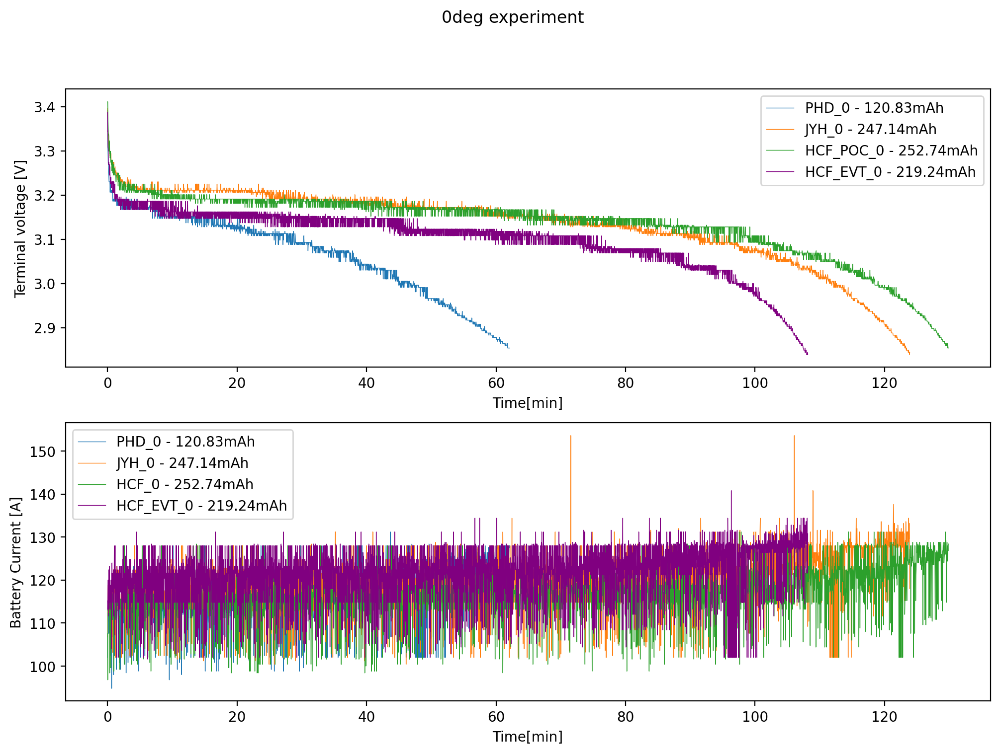

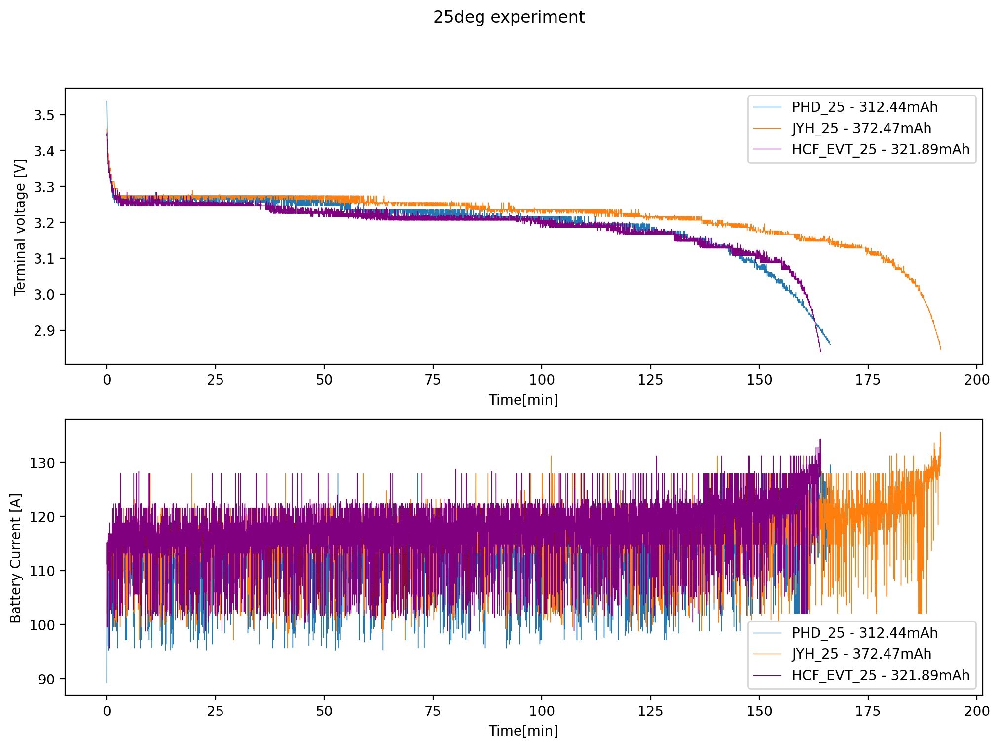

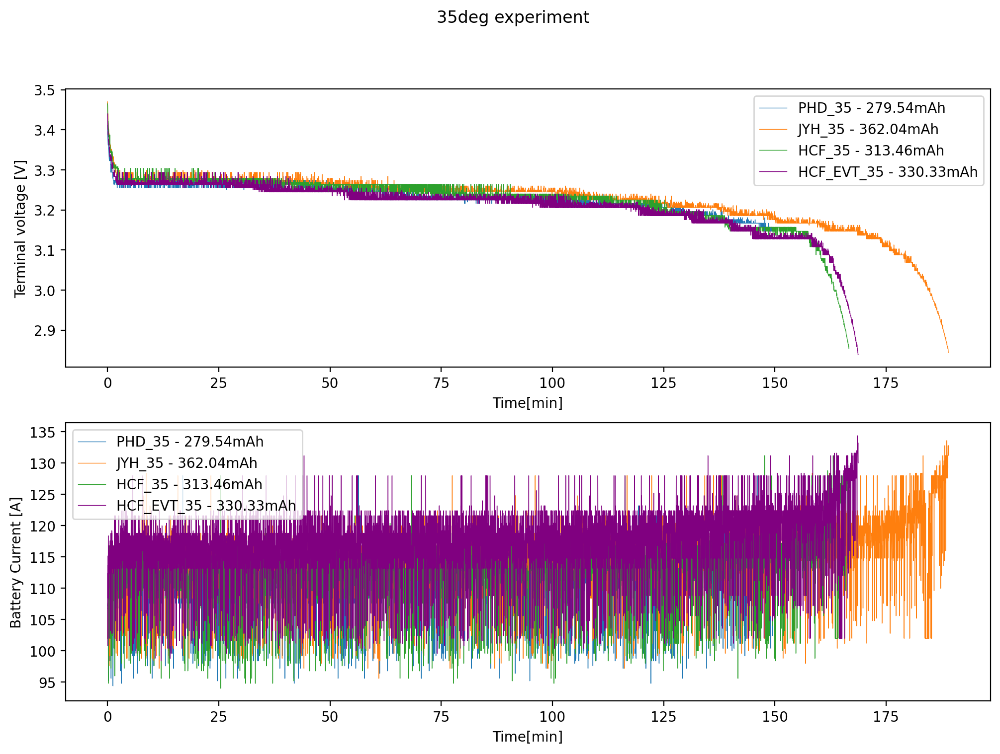

In [ ]:



PHD_0  = load_measured_data("dataset/battery_selection/PHD_evt/linear/discharge.linear.0_deg.csv")
PHD_25 = load_measured_data("dataset/battery_selection/PHD_evt/linear/discharge.linear.25_deg.csv")
PHD_35 = load_measured_data("dataset/battery_selection/PHD_evt/linear/discharge.linear.35_deg.csv")

JYH_0  = load_measured_data("dataset/battery_selection/JYH_evt/linear/discharge.linear.0_deg.csv")
JYH_25  = load_measured_data("dataset/battery_selection/JYH_evt/linear/discharge.linear.25_deg.csv")
JYH_35  = load_measured_data("dataset/battery_selection/JYH_evt/linear/discharge.linear.35_deg.csv")

HCF_0  = load_measured_data("dataset/battery_selection/HCF_poc/linear/discharge.linear.0_deg.csv")
HCF_35 = load_measured_data("dataset/battery_selection/HCF_poc/linear/discharge.linear.35_deg.csv")

HCF_EVT_0 = load_measured_data("dataset/battery_selection/HFC_evt/linear/discharge.linear.0_deg.csv")
HCF_EVT_25 = load_measured_data("dataset/battery_selection/HFC_evt/linear/discharge.linear.25_deg.csv")
HCF_EVT_35 = load_measured_data("dataset/battery_selection/HFC_evt/linear/discharge.linear.35_deg.csv")


fig, ax = plt.subplots(2,1)
fig.set_size_inches(12,8)
fig.set_dpi(200)

fig.suptitle("0deg experiment")

time_min = time_to_minutes(PHD_0.time)
ax[0].plot(time_min, PHD_0.vbat, label=f"PHD_0 - {coulomb_counter(PHD_0.time, PHD_0.ibat):.2f}mAh", linewidth=0.5)
time_min_JYH = time_to_minutes(JYH_0.time)
ax[0].plot(time_min_JYH, JYH_0.vbat, label=f"JYH_0 - {coulomb_counter(JYH_0.time, JYH_0.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF = time_to_minutes(HCF_0.time)
ax[0].plot(time_min_HCF, HCF_0.vbat, label=f"HCF_POC_0 - {coulomb_counter(HCF_0.time, HCF_0.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF_EVT = time_to_minutes(HCF_EVT_0.time)
ax[0].plot(time_min_HCF_EVT, HCF_EVT_0.vbat, label=f"HCF_EVT_0 - {coulomb_counter(HCF_EVT_0.time, HCF_EVT_0.ibat):.2f}mAh", color='purple', linewidth=0.5)


ax[0].legend()

time_min = time_to_minutes(PHD_0.time)
ax[1].plot(time_min, PHD_0.ibat, label=f"PHD_0 - {coulomb_counter(PHD_0.time, PHD_0.ibat):.2f}mAh", linewidth=0.5)
time_min_JYH = time_to_minutes(JYH_0.time)
ax[1].plot(time_min_JYH, JYH_0.ibat, label=f"JYH_0 - {coulomb_counter(JYH_0.time, JYH_0.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF = time_to_minutes(HCF_0.time)
ax[1].plot(time_min_HCF, HCF_0.ibat, label=f"HCF_0 - {coulomb_counter(HCF_0.time, HCF_0.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF = time_to_minutes(HCF_EVT_0.time)
ax[1].plot(time_min_HCF, HCF_EVT_0.ibat, label=f"HCF_EVT_0 - {coulomb_counter(HCF_EVT_0.time, HCF_EVT_0.ibat):.2f}mAh", color='purple', linewidth=0.5)

ax[1].legend()

ax[0].set_xlabel("Time[min]")
ax[0].set_ylabel("Terminal voltage [V]")
ax[1].set_xlabel("Time[min]")
ax[1].set_ylabel("Battery Current [A]")


fig, ax = plt.subplots(2,1)
fig.set_size_inches(12,8)
fig.set_dpi(200)

fig.suptitle("25deg experiment")

time_min = time_to_minutes(PHD_25.time)
ax[0].plot(time_min, PHD_25.vbat, label=f"PHD_25 - {coulomb_counter(PHD_25.time, PHD_25.ibat):.2f}mAh", linewidth=0.5)
time_min_JYH = time_to_minutes(JYH_25.time)
ax[0].plot(time_min_JYH, JYH_25.vbat, label=f"JYH_25 - {coulomb_counter(JYH_25.time, JYH_25.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF_EVT = time_to_minutes(HCF_EVT_25.time)
ax[0].plot(time_min_HCF_EVT, HCF_EVT_25.vbat, label=f"HCF_EVT_25 - {coulomb_counter(HCF_EVT_25.time, HCF_EVT_25.ibat):.2f}mAh", color='purple', linewidth=0.5)

ax[0].legend()

time_min = time_to_minutes(PHD_25.time)
ax[1].plot(time_min, PHD_25.ibat, label=f"PHD_25 - {coulomb_counter(PHD_25.time, PHD_25.ibat):.2f}mAh", linewidth=0.5)
time_min_JYH = time_to_minutes(JYH_25.time)
ax[1].plot(time_min_JYH, JYH_25.ibat, label=f"JYH_25 - {coulomb_counter(JYH_25.time, JYH_25.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF_EVT = time_to_minutes(HCF_EVT_25.time)
ax[1].plot(time_min_HCF_EVT, HCF_EVT_25.ibat, label=f"HCF_EVT_25 - {coulomb_counter(HCF_EVT_25.time, HCF_EVT_25.ibat):.2f}mAh", color='purple', linewidth=0.5)
ax[1].legend()

ax[0].set_xlabel("Time[min]")
ax[0].set_ylabel("Terminal voltage [V]")
ax[1].set_xlabel("Time[min]")
ax[1].set_ylabel("Battery Current [A]")


fig, ax = plt.subplots(2,1)
fig.set_size_inches(12,8)
fig.set_dpi(200)

fig.suptitle("35deg experiment")

time_min = time_to_minutes(PHD_35.time)
ax[0].plot(time_min, PHD_35.vbat, label=f"PHD_35 - {coulomb_counter(PHD_35.time, PHD_35.ibat):.2f}mAh", linewidth=0.5)
time_min_JYH = time_to_minutes(JYH_35.time)
ax[0].plot(time_min_JYH, JYH_35.vbat, label=f"JYH_35 - {coulomb_counter(JYH_35.time, JYH_35.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF = time_to_minutes(HCF_35.time)
ax[0].plot(time_min_HCF, HCF_35.vbat, label=f"HCF_35 - {coulomb_counter(HCF_35.time, HCF_35.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF = time_to_minutes(HCF_EVT_35.time)
ax[0].plot(time_min_HCF, HCF_EVT_35.vbat, label=f"HCF_EVT_35 - {coulomb_counter(HCF_EVT_35.time, HCF_EVT_35.ibat):.2f}mAh", color='purple', linewidth=0.5)

ax[0].legend()

time_min = time_to_minutes(PHD_35.time)
ax[1].plot(time_min, PHD_35.ibat, label=f"PHD_35 - {coulomb_counter(PHD_35.time, PHD_35.ibat):.2f}mAh", linewidth=0.5)
time_min_JYH = time_to_minutes(JYH_35.time)
ax[1].plot(time_min_JYH, JYH_35.ibat, label=f"JYH_35 - {coulomb_counter(JYH_35.time, JYH_35.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF = time_to_minutes(HCF_35.time)
ax[1].plot(time_min_HCF, HCF_35.ibat, label=f"HCF_35 - {coulomb_counter(HCF_35.time, HCF_35.ibat):.2f}mAh", linewidth=0.5)
time_min_HCF = time_to_minutes(HCF_EVT_35.time)
ax[1].plot(time_min_HCF, HCF_EVT_35.ibat, label=f"HCF_EVT_35 - {coulomb_counter(HCF_EVT_35.time, HCF_EVT_35.ibat):.2f}mAh", color='purple', linewidth=0.5)



ax[0].set_xlabel("Time[min]")
ax[0].set_ylabel("Terminal voltage [V]")
ax[1].set_xlabel("Time[min]")
ax[1].set_ylabel("Battery Current [A]")


ax[1].legend()

plt.show()


dataset/battery_selection/PHD_evt/switching/discharge.switching.0_deg.csv
[0.66968217 0.71667307 1.20633999 1.06252259 0.8411215  0.94792711
 1.06683519 1.2049874  0.91280388 1.01083308 1.26352305 1.33046441
 0.99578239 1.15476862 1.4416315  1.69681026 1.13438993 1.36003466
 1.84737443]
dataset/battery_selection/PHD_evt/switching/discharge.switching.25_deg.csv
[0.73640777 0.46772859 0.26078898 0.7715623  0.61189157 0.54922497
 0.27605502 0.73344578 0.72413104 0.57768924 0.39683789 0.63647204
 0.71191082 0.62433188 0.38807622 0.72570034 0.67201605 0.60965021
 0.79262515 0.57624077 0.69874275 0.58934749 0.67327612 0.53913702
 0.73951016 0.49983511 0.16372796 0.90408596 0.55259522 0.53106254
 0.5484233  0.61574931 0.72954415 0.61514196 0.5008952  0.80257239
 0.59310479 0.59271069 0.80044183 0.62467431 0.74084668 0.6432949
 0.71311091 0.53385988 0.74385633 0.61524912 0.60169976 0.76995054
 0.83316137 0.63265796 0.57070328 0.96761533 0.83164952 0.70206301
 0.71534686 0.98754547 1.11787565 0

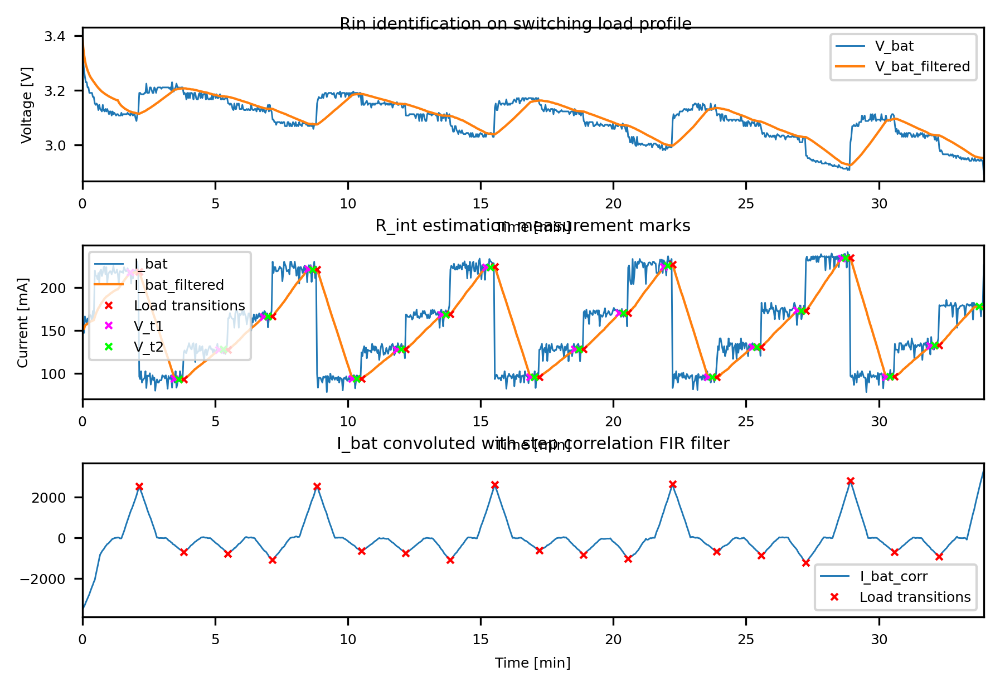

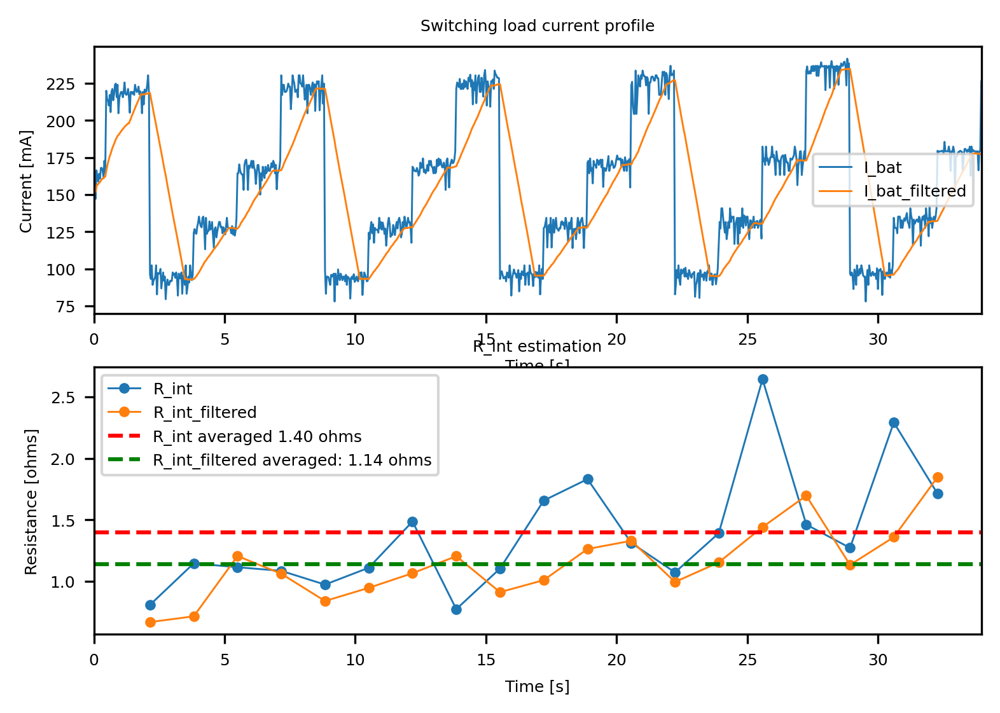

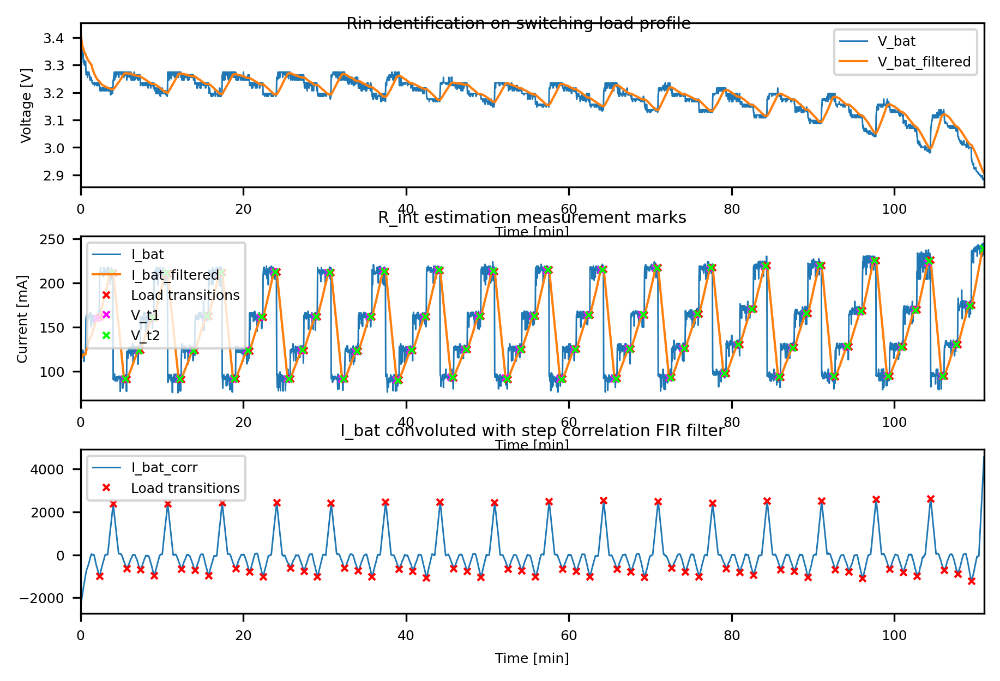

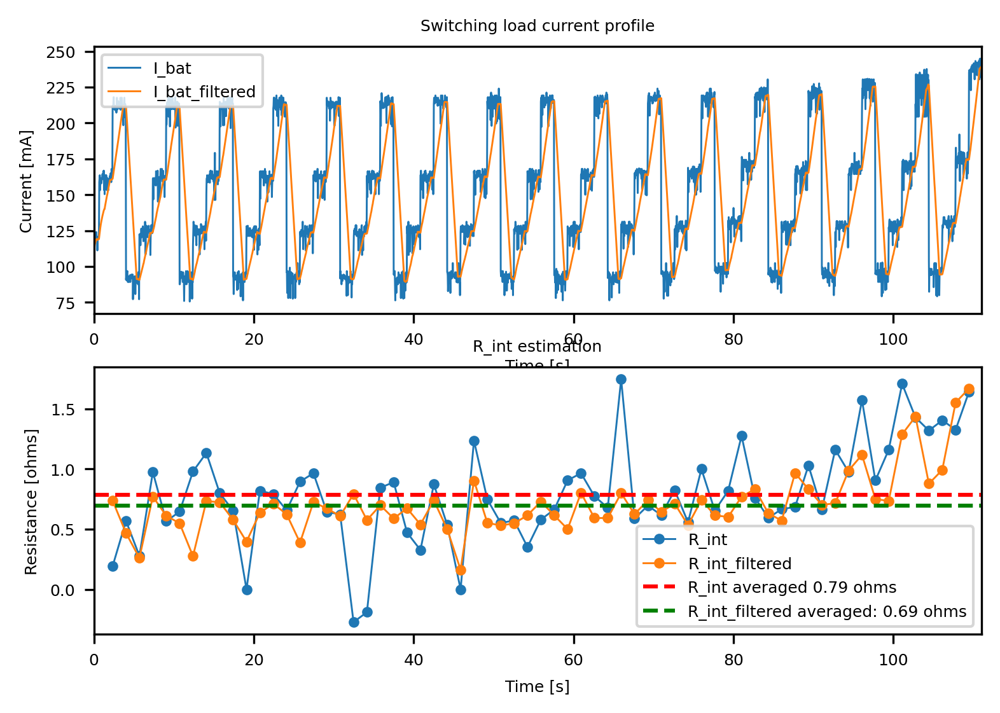

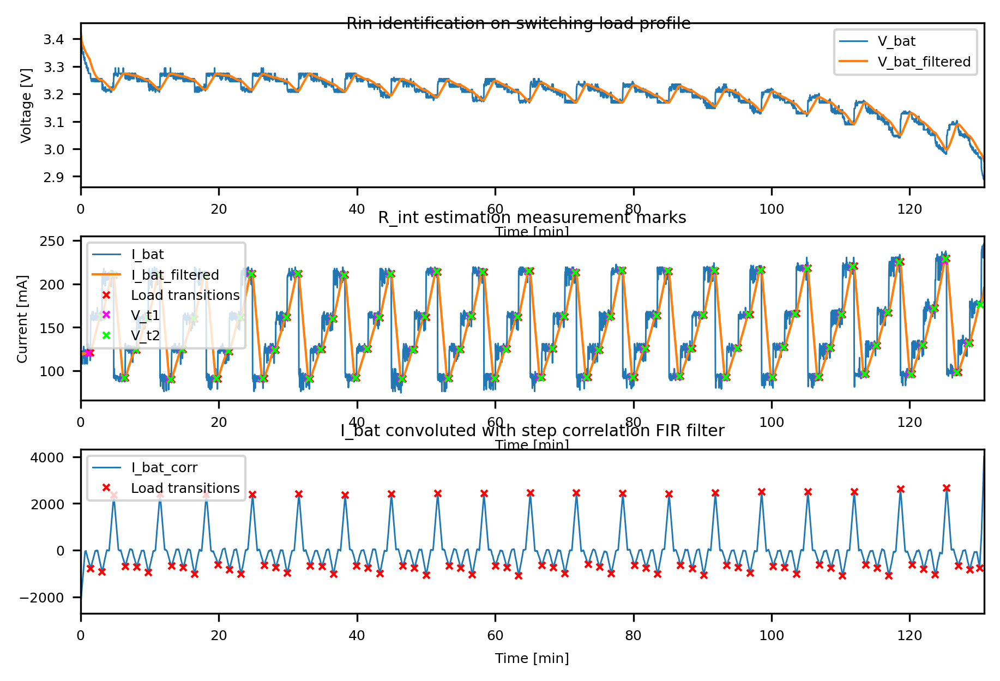

...

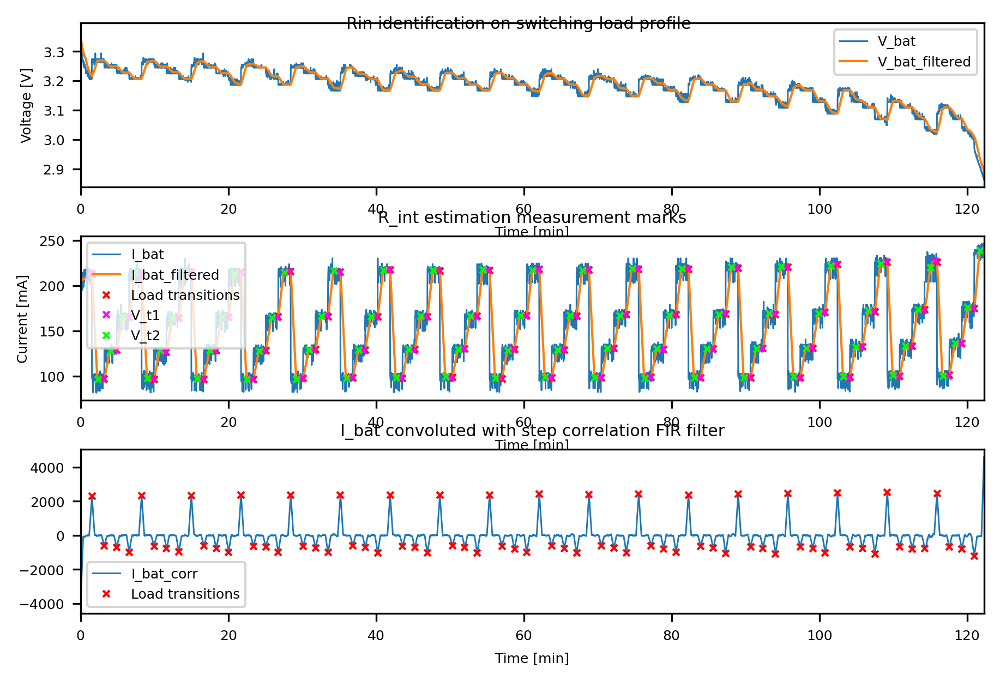

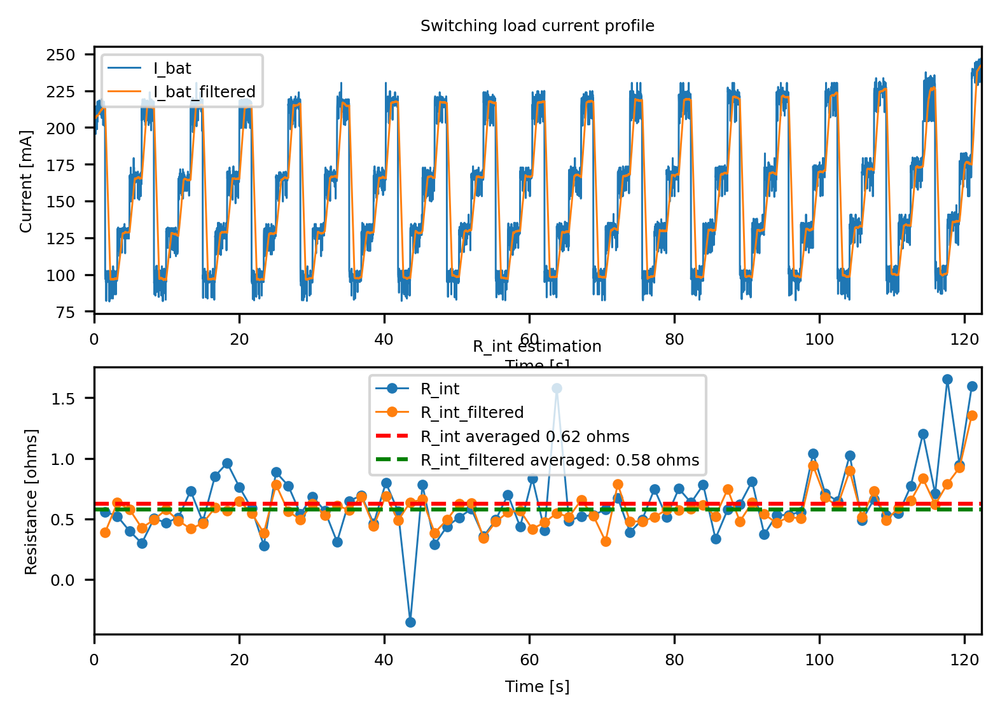

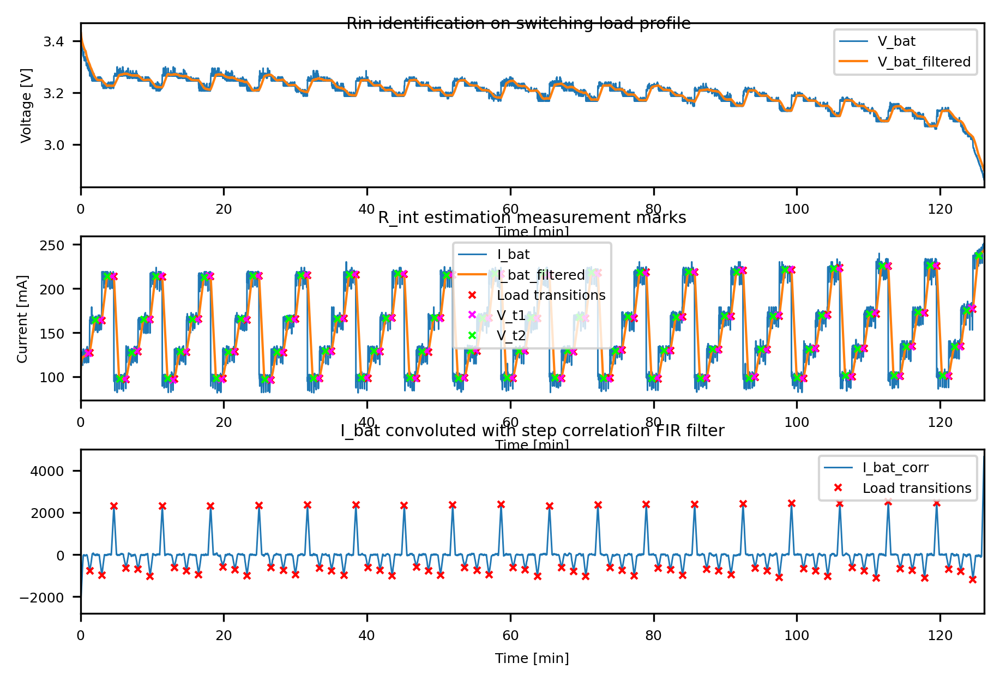

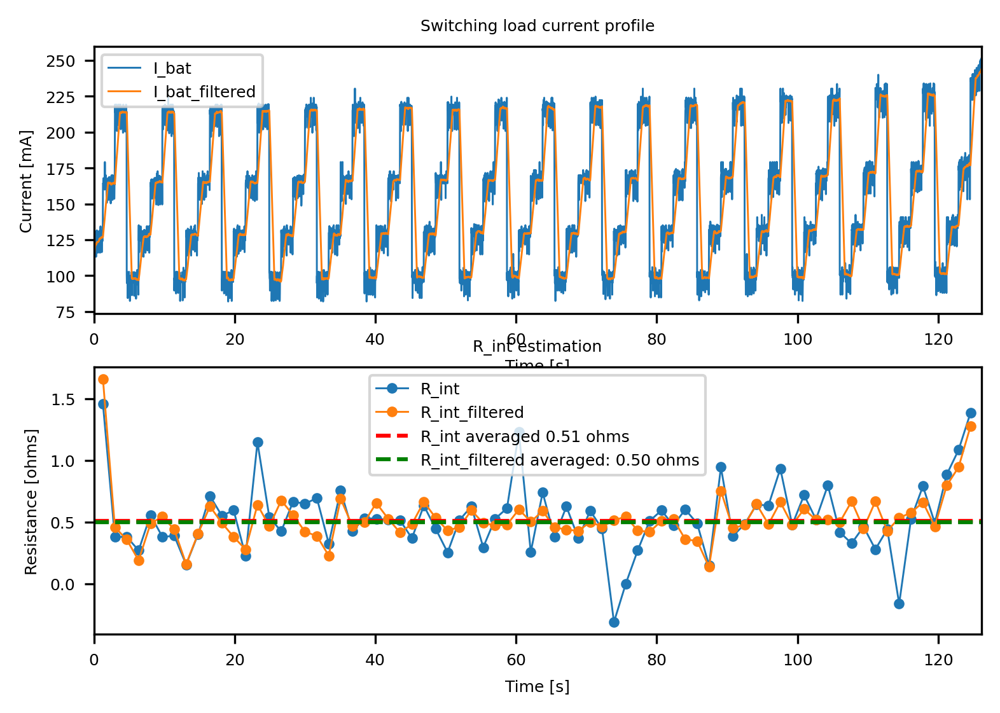

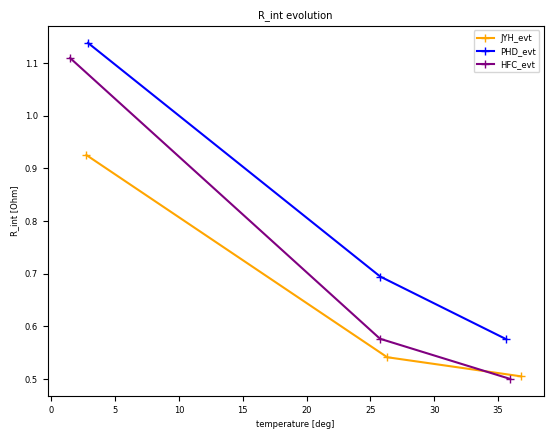

In [ ]:

PHD_0  = load_measured_data("dataset/battery_selection/PHD_evt/switching/discharge.switching.0_deg.csv")
PHD_25 = load_measured_data("dataset/battery_selection/PHD_evt/switching/discharge.switching.25_deg.csv")
PHD_35 = load_measured_data("dataset/battery_selection/PHD_evt/switching/discharge.switching.35_deg.csv")

JYH_0  = load_measured_data("dataset/battery_selection/JYH_evt/switching/discharge.switching.0_deg.csv")
JYH_25  = load_measured_data("dataset/battery_selection/JYH_evt/switching/discharge.switching.25_deg.csv")
JYH_35  = load_measured_data("dataset/battery_selection/JYH_evt/switching/discharge.switching.35_deg.csv")

HFC_0 = load_measured_data("dataset/battery_selection/HFC_evt/switching/discharge.switching.0_deg.csv")
HFC_25 = load_measured_data("dataset/battery_selection/HFC_evt/switching/discharge.switching.25_deg.csv")


phd_waveforms = Path("dataset/battery_selection/PHD_evt/switching").rglob("discharge.switching.*.csv")
jyh_waveforms = Path("dataset/battery_selection/JYH_evt/switching").rglob("discharge.switching.*.csv")
hfc_waveforms = Path("dataset/battery_selection/HFC_evt/switching").rglob("discharge.switching.*.csv")


phd_r = []
phd_temps = []

for w in sorted(phd_waveforms):

    discharge_profile = load_measured_data(w)

    print(w)
    R_int_estim = estimate_R_int(discharge_profile.time,
                                 discharge_profile.ibat,
                                 discharge_profile.vbat,
                                 discharge_profile.ntc_temp,
                                 debug=True)

    temp, _ = get_mean_temp(discharge_profile.ntc_temp)
    phd_r.append(R_int_estim)
    phd_temps.append(temp)

jyh_r = []
jyh_temps = []
for w in sorted(jyh_waveforms):

    discharge_profile = load_measured_data(w)

    print(w)
    R_int_estim = estimate_R_int(discharge_profile.time,
                                 discharge_profile.ibat,
                                 discharge_profile.vbat,
                                 discharge_profile.ntc_temp,
                                 debug=True)

    temp, _  = get_mean_temp(discharge_profile.ntc_temp)

    jyh_r.append(R_int_estim)
    jyh_temps.append(temp)

hfc_r = []
hfc_temps = []
for w in sorted(hfc_waveforms):

    discharge_profile = load_measured_data(w)

    print(w)
    R_int_estim = estimate_R_int(discharge_profile.time,
                                 discharge_profile.ibat,
                                 discharge_profile.vbat,
                                 discharge_profile.ntc_temp,
                                 debug=True)

    temp, _  = get_mean_temp(discharge_profile.ntc_temp)

    hfc_r.append(R_int_estim)
    hfc_temps.append(temp)

fig,ax = plt.subplots()
ax.set_title("R_int evolution")
ax.plot(jyh_temps, jyh_r, marker="+", linestyle="-", color="orange", label="JYH_evt")
ax.plot(phd_temps, phd_r, marker="+", linestyle="-", color="blue", label="PHD_evt")
ax.plot(hfc_temps, hfc_r, marker="+", linestyle="-", color="purple", label="HFC_evt")
ax.set_xlabel("temperature [deg]")
ax.set_ylabel("R_int [Ohm]")
ax.legend()
